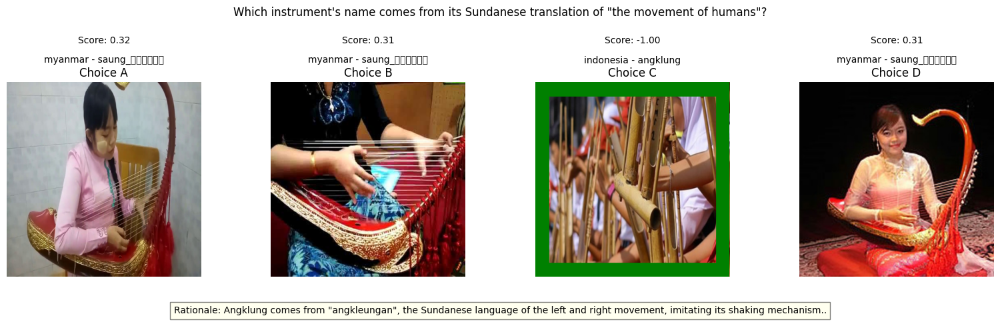

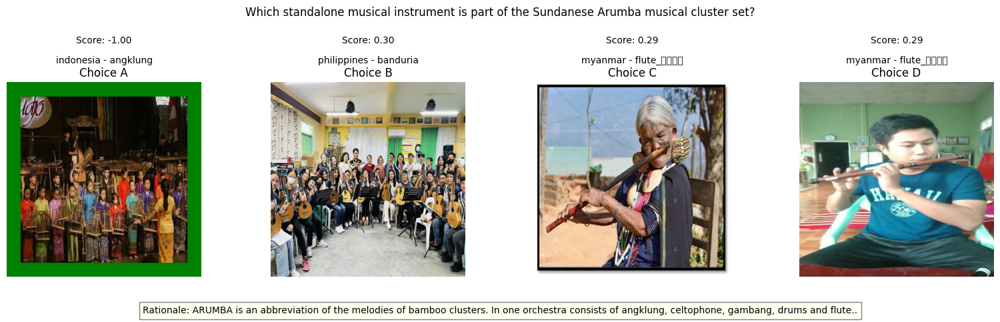

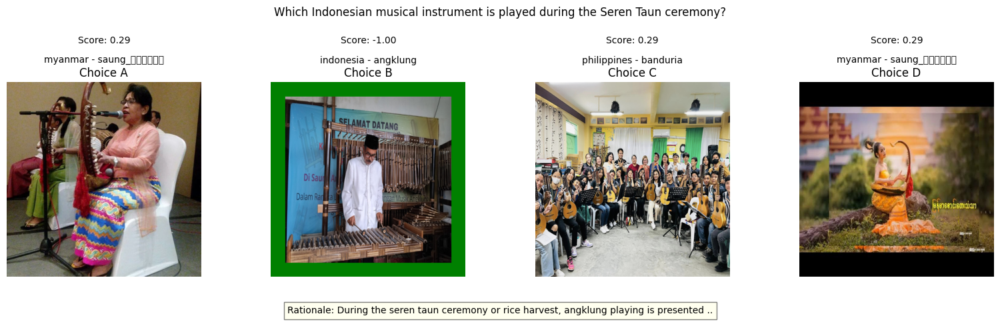

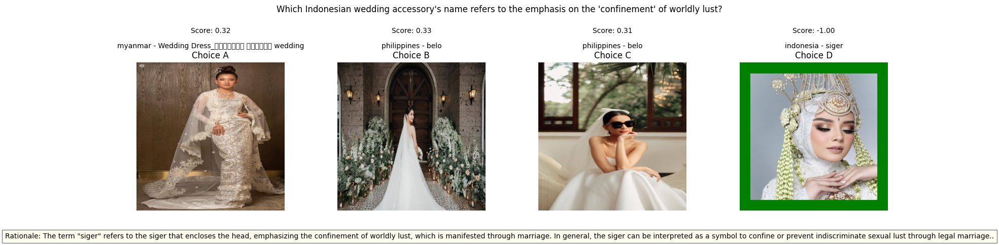

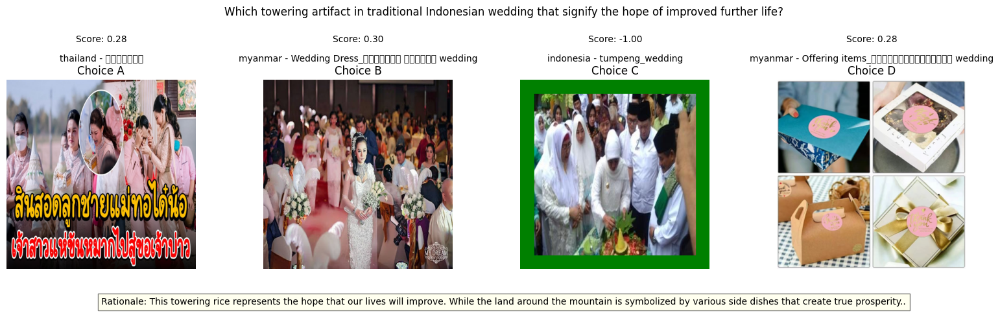

...

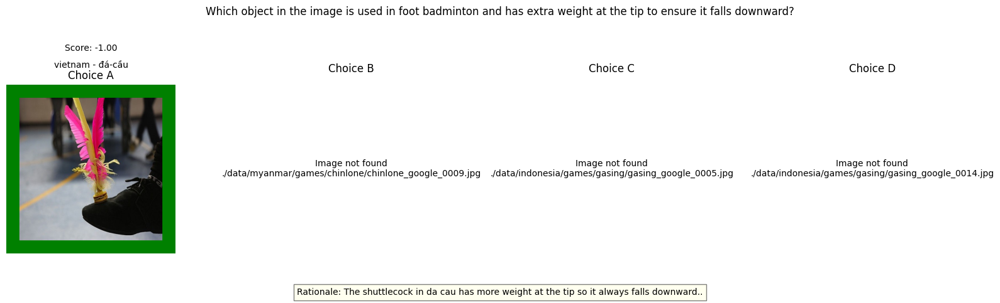

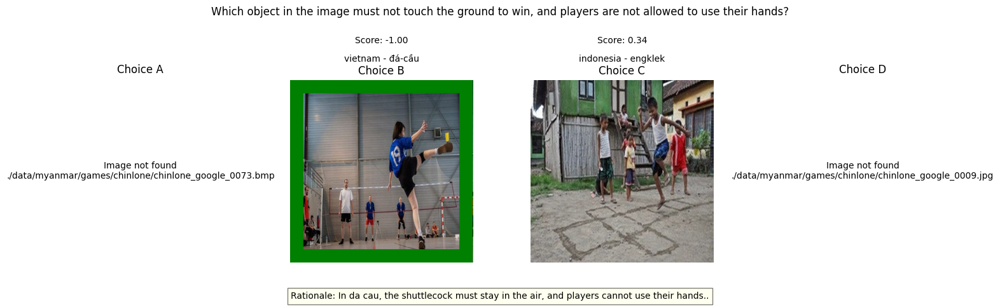

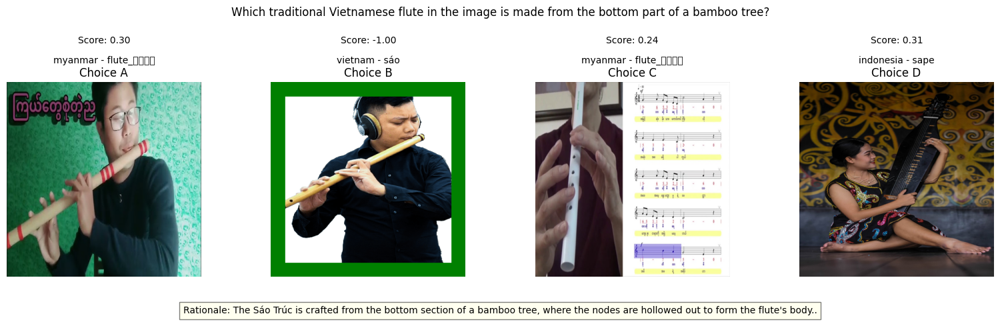

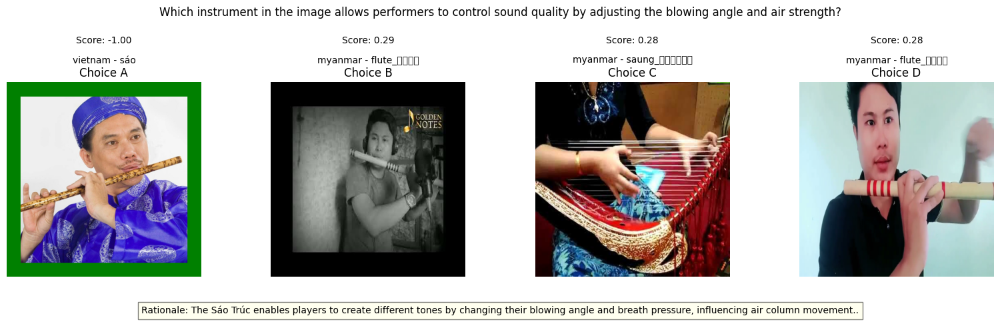

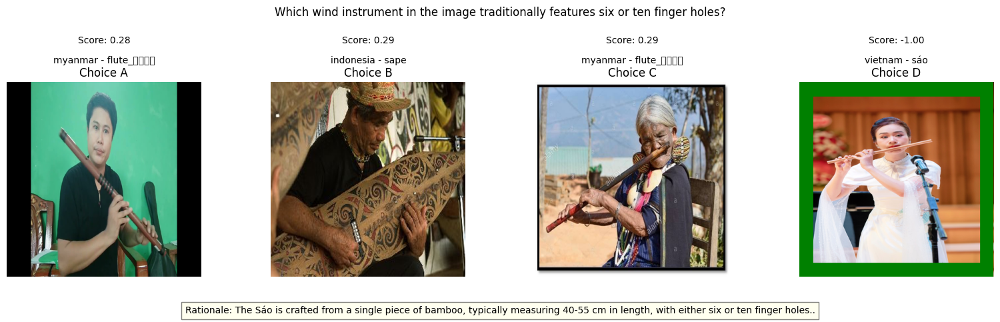

In [3]:
import matplotlib.pyplot as plt
from PIL import Image
import os
from matplotlib.patches import Rectangle
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

def visualize_question(question_df):
    for row_idx, question_row in question_df.iterrows():
        fig = plt.figure(figsize=(16, 4))
        plt.suptitle(question_row['question'], fontsize=12, y=1.05)
        
        choices = ['choice_a', 'choice_b', 'choice_c', 'choice_d']
        
        # Get scores from data
        scores = [
            question_row.get('score_a', 0.5),
            question_row.get('score_b', 0.3), 
            question_row.get('score_c', 0.8),
            question_row.get('score_d', 0.2)
        ]
        
        for idx, choice in enumerate(choices, start=1):
            choice_parts = question_row[choice].split('#')
            # choice_parts[2] = f"annotated_{choice_parts[2]}"
            img_path = os.path.join('./data', *choice_parts)
            
            ax = plt.subplot(1, 4, idx)
            
            try:
                img = Image.open(img_path)
                img = img.resize((400, 400), Image.Resampling.LANCZOS)
                plt.imshow(img)
                
                # add green border if this is correct answer
                if question_row[choice] == question_row['correct_answer']:
                    ax.add_patch(Rectangle((0, 0), img.size[0], img.size[1], 
                                        fill=False, edgecolor='green', linewidth=30))
                
                # Display score from data
                plt.text(200, -80, f'Score: {scores[idx-1]:.2f}', ha='center')
                
                # Display country and name
                country_name = f"{choice_parts[0]} - {choice_parts[2]}"
                plt.text(200, -40, country_name, ha='center')
                    
            except Exception as e:
                plt.text(0.5, 0.5, f"Image not found\n{img_path}", 
                        ha='center', va='center')
                
            plt.axis('off')
            plt.title(f"Choice {choice[-1].upper()}")
        
        # Add rationale text below the choices
        plt.figtext(0.5, -0.1, f"Rationale: {question_row['rationale']}.", 
                   ha='center', fontsize=10, bbox=dict(facecolor='lightyellow', alpha=0.5))
        
        plt.tight_layout()
        plt.show()

# Load questions from JSONL file
import json

questions_df = pd.DataFrame()
with open('../generated_mcq/questions_1741940098.jsonl', 'r', encoding='utf-8') as f:
    questions = [json.loads(line) for line in f]
questions_df = pd.DataFrame(questions)


visualize_question(questions_df.head(20))